# 파이썬으로 배우는 기계학습
# Machine Learning with Python

# 제 12-2 강: Deep Neural Net 2

## 학습목표 
- 기계학습을 위한 오픈 프레임워크는 무엇이 있는지 알아본다.
- TensorFlow, Keras, PyTorch가 무엇인지 이해한다.
- CNN을 이용한 MNIST 데이터를 3가지 프레임워크로 학습하는 것을 이해한다. 

## 학습 내용
- 기계학습을 위한 오픈 프레임워크
- TensorFlow
- Keras
- PyTorch
- MNIST 데이터셋 분석


In [1]:
# Package imports
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import sklearn
import sklearn.datasets
import sklearn.linear_model
# Our own private imports
import imp
import joy
imp.reload(joy)

%matplotlib inline
np.random.seed(1)   # a good practice for reproducibility and debugging

# The following code is used for hiding the warnings and 
# make this notebook clearer.
#import warnings
#warnings.filterwarnings('ignore')

C:\Users\user\Anaconda3\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


## Deep Neural Net 구현

지금까지 우리는 신경망의 신호처리를 행렬로 표기하면 개발해왔습니다. 이러한 표기법을 바탕으로 어렵지 않게 딥러닝에 필요한 다층 신경망을 구현할 수 있습니다. 

In [3]:
def tanh(x):
    return (1.0 - np.exp(-2 * x))/(
            1.0 + np.exp(-2 * x))
def tanh_d(x):
    return (1 + tanh(x)) * (1 - tanh(x))

def sigmoid(x): 
    #x = np.clip(x, -500, 500)  
    return 1 / (1 + np.exp((-x)))

def sigmoid_d(x):
    return sigmoid(x) * (1 - sigmoid(x))

def relu(x):
    return np.maximum(x, 0)

def relu_d(x):
    x[x<=0] = 0
    x[x>0] = 1
    return x

def softmax(x):
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum()

In [4]:
#%%writefile code/mnistDeepNet.py
#%load code/mnistDeepNet.py
# deep neural net
# version 0.1
# author: idebtor@gmail.com 

import sys
class DeepNeuralNet(object):
    """ implements a deep neural net. 
        Users may specify any number of layers.
        net_arch -- consists of a number of neurons in each layer 
    """
    def __init__(self, net_arch, activate = None, eta = 1.0, epochs = 100, random_seed = 1):
        self.eta = eta
        self.epochs = epochs
        self.net_arch = net_arch
        self.layers = len(net_arch)
        self.W = []
        self.random_seed = random_seed
        
        self.g       = [lambda x: sigmoid(x)   for _ in range(self.layers)]
        self.g_prime = [lambda x: sigmoid_d(x) for _ in range(self.layers)]
        
        if activate is not None:
            for i, (g, g_prime) in enumerate(zip(activate[::2], activate[1::2])):
                self.g[i+1] = g
                self.g_prime[i+1] = g_prime
                
        for i in range(len(self.g)):
            print(type(self.g[i]), id(self.g[i]))
        
        #print('X.shape={}, y.shape{}'.format(X.shape, y.shape))
        # Random initialization with range of weight values (-1,1)
        np.random.seed(self.random_seed)
        
        # A place holder [None] is used to indicated "unused place".
        self.W = [[None]]    ## the first W0 is not used.
        for layer in range(self.layers - 1):
            w = 2 * np.random.rand(self.net_arch[layer+1], 
                                   self.net_arch[layer]) - 1
            print('layer:', layer, 'shape:', w.shape)
            self.W.append(w)  
        print('Weight:', self.W)
            
    def forpass(self, A0):     
        Z = [[None]]   # Z0 is not used.
        A = []       # A0 = X0 is used. 
        A.append(A0)
        for i in range(1, len(self.W)):
            z = np.dot(self.W[i], A[i-1])
            Z.append(z)
            a = self.g[i](z)
            A.append(a)
        return Z, A
    
    def backprop(self, Z, A, Y):
        # initialize empty lists to save E and dZ
        # A place holder None is used to indicated "unused place".
        E  = [None for x in range(self.layers)]
        dZ = [None for x in range(self.layers)]
        
        # Get error at the output layer or the last layer
        ll = self.layers - 1
        error = Y - A[ll]
        E[ll] = error   
        dZ[ll] = error * self.g_prime[ll](Z[ll]) 
        
        # Begin from the back, from the next to last layer
        for i in range(self.layers-2, 0, -1):
            E[i]  = np.dot(self.W[i+1].T, E[i+1])
            dZ[i] = E[i] * self.g_prime[i](Z[i])
       
        # Adjust the weights, using the backpropagation rules
        m = Y.shape[0] # number of samples
        for i in range(ll, 0, -1):
            self.W[i] += self.eta * np.dot(dZ[i], A[i-1].T) / m
        return error
         
    def fit(self, X, y):
        print('fit')
        self.cost_ = []        
        for epoch in range(self.epochs):          
            Z, A = self.forpass(X)        
            cost = self.backprop(Z, A, y)   
            self.cost_.append(
                 np.sqrt(np.sum(cost * cost)))    
        return self

    def predict(self, X):
        print('predict')
        A0 = np.array(X, ndmin=2).T         # A0: inputs
        Z, A = self.forpass(A0)     # forpass
        return A[-1]                                       
   
    def evaluate(self, Xtest, ytest):       # fully vectorized calculation
        print('evaluate')
        m_samples = len(ytest)
        scores = 0        
        A3 = self.predict(Xtest)
        yhat = np.argmax(A3, axis = 0)
        scores += np.sum(yhat == ytest)
        return scores/m_samples * 100
    

In [64]:
def __init__(self, net_arch, activate = None, 
             eta = 1.0, epochs = 100, random_seed = 1):
    self.eta = eta
    self.epochs = epochs
    self.net_arch = net_arch
    self.layers = len(net_arch)
    self.W = []

    self.g       = [lambda x: sigmoid(x)   for _ in range(self.layers)]
    self.g_prime = [lambda x: sigmoid_d(x) for _ in range(self.layers)]

    if activate is not None:
        for i, (g, g_prime) in enumerate(zip(activate[::2], activate[1::2])):
            self.g[i+1] = g
            self.g_prime[i+1] = g_prime

    np.random.seed(random_seed)
    self.W = [[None]]    ## the first W0 is not used.
    for layer in range(self.layers - 1):
        w = 2 * np.random.rand(self.net_arch[layer+1], 
                               self.net_arch[layer]) - 1
        self.W.append(w)    

In [ ]:
class DeepNeuralNet():
    """ implements a deep neural net. 
        Users may specify any number of layers.
        net_arch -- consists of a number of neurons in each layer 
    """
    def __init__(self, net_arch, activate = None, 
                 eta = 1.0, epochs = 100, random_seed = 1):
        pass
  
    def forpass(self, A0):     
        pass
    
    def backprop(self, Z, A, Y):
        pass
    
    def fit(self, X, y):
        pass   

    def predict(self, X):
        pass                                     
   
    def evaluate(self, Xtest, ytest):      
        pass

In [7]:
def forpass(self, A0):     
    Z = [[None]] # Z0 is not used.
    A = []       # A0 = X0 is used. 
    A.append(A0)
    for i in range(1, len(self.W)):
        z = np.dot(self.W[i], A[i-1])
        Z.append(z)
        a = self.g[i](z)
        A.append(a)
    return Z, A

In [ ]:
def backprop(self, Z, A, Y):
    E  = [None for x in range(self.layers)]
    dZ = [None for x in range(self.layers)]

    ll = self.layers - 1
    error = Y - A[ll]
    E[ll] = error   
    dZ[ll] = error * self.g_prime[ll](Z[ll]) 

    for i in range(self.layers-2, 0, -1):
        E[i]  = np.dot(self.W[i+1].T, E[i+1])
        dZ[i] = E[i] * self.g_prime[i](Z[i])

    m = Y.shape[0] # number of samples
    for i in range(ll, 0, -1):
        self.W[i] += self.eta * np.dot(dZ[i], A[i-1].T) / m
    return error

[[0 0 1 1]
 [0 1 0 1]] 
 [0 1 1 0]
[0 0] [0.011]
[0 1] [0.991]
[1 0] [0.991]
[1 1] [0.009]
(1, 14884)


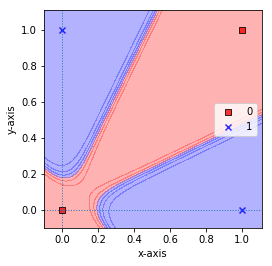

In [26]:
import joy
import matplotlib.pyplot as plt 
import numpy as np
%matplotlib inline

# Set the input data and labels for XOR
X = np.array([ [0, 0, 1, 1], [0, 1, 0, 1] ])
y = np.array([0, 1, 1, 0])
print(X, "\n", y)

# Initialize the deep neural net with
dnn = DeepNeuralNet([2, 4, 2, 1], eta = 0.9, epochs = 10000)  

# training the deep neural net objcet with X, y
dnn.fit(X, y)             
    
Ao = dnn.predict(X.T)
for x, yhat in zip(X.T, Ao.T):
    print(x, np.round(yhat, 3))

joy.plot_decision_regions(X.T, y, dnn)   
plt.xlabel('x-axis')
plt.ylabel('y-axis')
plt.legend(loc='best')
plt.show()

<class 'function'> 1772201244600
<class 'function'> 1772201244464
<class 'function'> 1772201246232
<class 'function'> 1772249029488
layer: 0 shape: (4, 2)
layer: 1 shape: (3, 4)
layer: 2 shape: (1, 3)
Weight: [[None], array([[-0.16595599,  0.44064899],
       [-0.99977125, -0.39533485],
       [-0.70648822, -0.81532281],
       [-0.62747958, -0.30887855]]), array([[-0.20646505,  0.07763347, -0.16161097,  0.370439  ],
       [-0.5910955 ,  0.75623487, -0.94522481,  0.34093502],
       [-0.1653904 ,  0.11737966, -0.71922612, -0.60379702]]), array([[ 0.60148914,  0.93652315, -0.37315164]])]
fit
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, ty

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

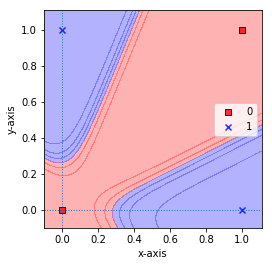

In [37]:
import joy
X = np.array([ [0, 0, 1, 1], [0, 1, 0, 1] ])
y = np.array([0, 1, 1, 0])
dnn = DeepNeuralNet([2, 4, 3, 1], eta = 0.5, epochs = 5000).fit(X, y)   

joy.plot_decision_regions(X.T, y, dnn)   
plt.xlabel('x-axis')
plt.ylabel('y-axis')
plt.legend(loc='best')
plt.show()

### 6.3 오차(self.cost_)의 시각화 

신경망을 학습시키면서 발생하는 오차(손실)를 MnistMiniBatch객체의 속성 `cost_`에 저장되어 있습니다. 이를 시각화해서 신경망이 어떻게 학습을 하였는지, 손실을 최소화하는 방향을 수렴하였는지 분석할 수 있습니다.  다음 셀의 코드를 실행해 봅시다.  

(1, 14884)


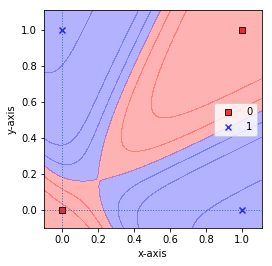

In [15]:
import joy
X = np.array([ [0, 0, 1, 1], [0, 1, 0, 1] ])
y = np.array([0, 1, 1, 0])
dnn = DeepNeuralNet([2, 4, 1], eta = 0.5, epochs = 5000).fit(X, y)   

joy.plot_decision_regions(X.T, y, dnn)   
plt.xlabel('x-axis')
plt.ylabel('y-axis')
plt.legend(loc='best')
plt.show()

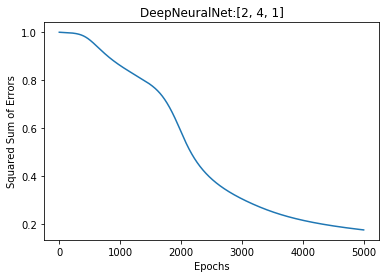

In [16]:
plt.plot(range(len(dnn.cost_)), dnn.cost_)
plt.xlabel('Epochs')
plt.ylabel('Squared Sum of Errors')
plt.title('DeepNeuralNet:{}'.format(dnn.net_arch))
plt.show()

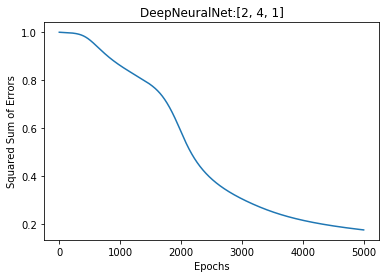

In [17]:
dnn = DeepNeuralNet([2, 4, 1], 
                    eta = 0.5, epochs = 5000).fit(X, y) 
plt.plot(range(len(dnn.cost_)), dnn.cost_)
plt.xlabel('Epochs')
plt.ylabel('Squared Sum of Errors')
plt.title('DeepNeuralNet:{}'.format(dnn.net_arch))
plt.show()

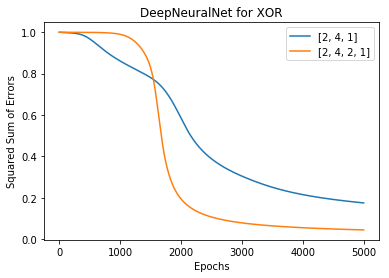

In [5]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

X = np.array([ [0, 0, 1, 1], [0, 1, 0, 1] ])
y = np.array([0, 1, 1, 0])

dnn1 = DeepNeuralNet([2,4,1], eta = 0.5, epochs = 5000).fit(X, y) 

g = [sigmoid, sigmoid_d, sigmoid, sigmoid_d, sigmoid, sigmoid_d]
dnn2 = DeepNeuralNet([2,4,2,1], activate=g, eta = 0.5, epochs = 5000).fit(X, y) 
plt.plot(range(len(dnn1.cost_)), dnn1.cost_, label='{}'.format(dnn1.net_arch))
plt.plot(range(len(dnn2.cost_)), dnn2.cost_, label='{}'.format(dnn2.net_arch))
plt.title('DeepNeuralNet for XOR')
plt.xlabel('Epochs')
plt.ylabel('Squared Sum of Errors')
plt.legend(loc='best')
plt.show()

## KMOOC 12강 과제

### XOR Deep Neural Network 모델 비교하기 

<class 'function'> 1772249029080
<class 'function'> 1772249029216
<class 'function'> 1772249028128
layer: 0 shape: (4, 2)
layer: 1 shape: (1, 4)
Weight: [[None], array([[-0.16595599,  0.44064899],
       [-0.99977125, -0.39533485],
       [-0.70648822, -0.81532281],
       [-0.62747958, -0.30887855]]), array([[-0.20646505,  0.07763347, -0.16161097,  0.370439  ]])]
fit
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmo

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'nu

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigm

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh

sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigm

tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh

tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh

tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigm

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
<class 'function'> 1772251521232
<class 'function'> 1772252950872
<class 'function'> 1772251521368
<class 'function'> 1772251524632
layer: 0 shape: (4, 2)
layer: 1 shape: (2, 4)
layer: 2 shape: (1, 2)
Weight: [[None], array([[-0.16595599,  0.44064899],
       [-0.99977125, -0.39533485],
       [-

tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh

tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigm

tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh

tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh

tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigm

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigm

tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh

sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigm

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigm

tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh

sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigm

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigm

tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigm

tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh

tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh

tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh

tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh

sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigm

tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
sigmoid, type= <class 'numpy.ndarray'>
tanh
tanh
tanh

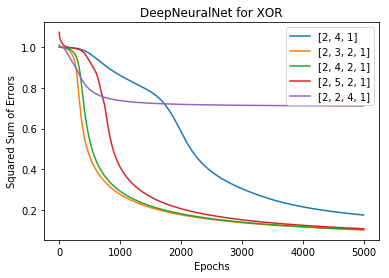

In [39]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

X = np.array([ [0, 0, 1, 1], [0, 1, 0, 1] ])
y = np.array([0, 1, 1, 0])

dnn1 = DeepNeuralNet([2,4,1], eta = 0.5, epochs = 5000).fit(X, y) 

g = [tanh, tanh_d]
dnn2 = DeepNeuralNet([2,3,2,1], activate=g, eta = 0.5, epochs = 5000).fit(X, y) 
dnn3 = DeepNeuralNet([2,4,2,1], activate=g, eta = 0.5, epochs = 5000).fit(X, y) 
dnn4 = DeepNeuralNet([2,5,2,1], activate=g, eta = 0.5, epochs = 5000).fit(X, y) 
dnn5 = DeepNeuralNet([2,2,4,1], activate=g, eta = 0.5, epochs = 5000).fit(X, y) 

plt.plot(range(len(dnn1.cost_)), dnn1.cost_, label='{}'.format(dnn1.net_arch))
plt.plot(range(len(dnn2.cost_)), dnn2.cost_, label='{}'.format(dnn2.net_arch))
plt.plot(range(len(dnn3.cost_)), dnn3.cost_, label='{}'.format(dnn3.net_arch))
plt.plot(range(len(dnn4.cost_)), dnn4.cost_, label='{}'.format(dnn4.net_arch))
plt.plot(range(len(dnn5.cost_)), dnn5.cost_, label='{}'.format(dnn5.net_arch))
plt.title('DeepNeuralNet for XOR')
plt.xlabel('Epochs')
plt.ylabel('Squared Sum of Errors')
plt.legend(loc='best')
plt.show()

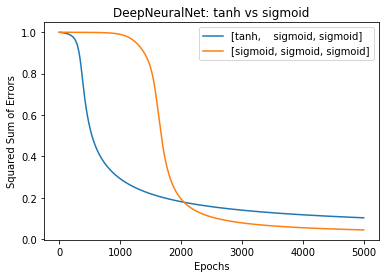

In [18]:
g1 = [tanh, tanh_d, sigmoid, sigmoid_d, sigmoid, sigmoid_d]
dnn1 = DeepNeuralNet([2,4,2,1], activate=g1, eta = 0.5, epochs = 5000).fit(X, y) 
g2 = [sigmoid, sigmoid_d, sigmoid, sigmoid_d, sigmoid, sigmoid_d]
dnn2 = DeepNeuralNet([2,4,2,1], activate=g2, eta = 0.5, epochs = 5000).fit(X, y) 
plt.plot(range(len(dnn1.cost_)), dnn1.cost_, label='[tanh,    sigmoid, sigmoid]')
plt.plot(range(len(dnn2.cost_)), dnn2.cost_, label='[sigmoid, sigmoid, sigmoid]')
plt.title('DeepNeuralNet: tanh vs sigmoid')
plt.xlabel('Epochs')
plt.ylabel('Squared Sum of Errors')
plt.legend(loc='best')
plt.show()

## Three-layer neural net vs Four-layer neural net

[[0 0 1 1]
 [0 1 0 1]] 
 [0 1 1 0]


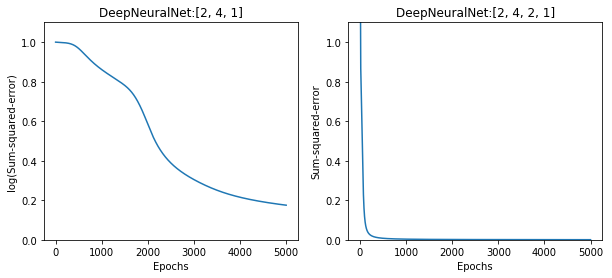

In [48]:
# Set the input data and labels for XOR
X = np.array([ [0, 0, 1, 1], [0, 1, 0, 1] ])
y = np.array([0, 1, 1, 0])
print(X, "\n", y)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))
dnn1 = DeepNeuralNet([2, 4, 1], eta=0.5, epochs = 5000).fit(X,y)
ax[0].plot(range(1, len(dnn1.cost_) + 1), dnn1.cost_)
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('log(Sum-squared-error)')
ax[0].set_ylim([0.0, 1.1])
ax[0].set_title('DeepNeuralNet:{}'.format(dnn1.net_arch))

g = [tanh, tanh_d, relu, relu_d, tanh, tanh_d]
dnn2 = DeepNeuralNet([2, 4, 2, 1], activate=g, eta=0.5, epochs=5000).fit(X, y)
ax[1].plot(range(1, len(dnn2.cost_) + 1), dnn2.cost_)
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Sum-squared-error')
ax[1].set_ylim([0.0, 1.1])
ax[1].set_title('DeepNeuralNet:{}'.format(dnn2.net_arch))
plt.show()

# 각 층별로 활성화 함수를 지정하기

[[0 0 1 1]
 [0 1 0 1]] 
 [0 1 1 0]


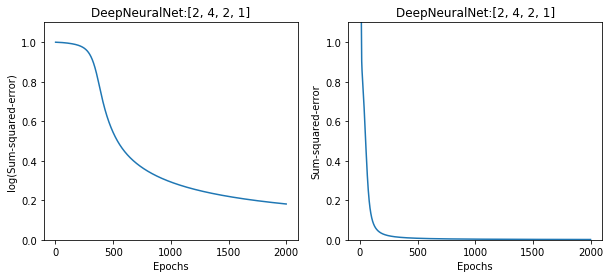

In [52]:
# Set the input data and labels for XOR
X = np.array([ [0, 0, 1, 1], [0, 1, 0, 1] ])
y = np.array([0, 1, 1, 0])
print(X, "\n", y)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

g = [tanh, tanh_d, sigmoid, sigmoid_d, sigmoid, sigmoid_d]
dnn1 = DeepNeuralNet([2, 4, 2, 1], activate = g, eta = 0.5, epochs = 2000).fit(X,y)
ax[0].plot(range(1, len(dnn1.cost_) + 1), dnn1.cost_)
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('log(Sum-squared-error)')
ax[0].set_ylim([0.0, 1.1])
ax[0].set_title('DeepNeuralNet:{}'.format(dnn1.net_arch))

g = [tanh, tanh_d, relu, relu_d, tanh, tanh_d]
dnn2 = DeepNeuralNet([2, 4, 2, 1], activate = g, eta=0.5, epochs=2000).fit(X, y)
ax[1].plot(range(1, len(dnn2.cost_) + 1), dnn2.cost_)
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Sum-squared-error')
ax[1].set_ylim([0.0, 1.1])
ax[1].set_title('DeepNeuralNet:{}'.format(dnn2.net_arch))
plt.show()

[[0 0 1 1]
 [0 1 0 1]] 
 [0 1 1 0]
<class 'function'> 2748761894016
<class 'function'> 2748761876000
<class 'function'> 2748764066408
<class 'function'> 2748764066408
layer: 0 shape: (18, 2)
layer: 1 shape: (4, 18)
layer: 2 shape: (1, 4)
Weight: [[None], array([[-0.16595599,  0.44064899],
       [-0.99977125, -0.39533485],
       [-0.70648822, -0.81532281],
       [-0.62747958, -0.30887855],
       [-0.20646505,  0.07763347],
       [-0.16161097,  0.370439  ],
       [-0.5910955 ,  0.75623487],
       [-0.94522481,  0.34093502],
       [-0.1653904 ,  0.11737966],
       [-0.71922612, -0.60379702],
       [ 0.60148914,  0.93652315],
       [-0.37315164,  0.38464523],
       [ 0.7527783 ,  0.78921333],
       [-0.82991158, -0.92189043],
       [-0.66033916,  0.75628501],
       [-0.80330633, -0.15778475],
       [ 0.91577906,  0.06633057],
       [ 0.38375423, -0.36896874]]), array([[ 0.37300186,  0.66925134, -0.96342345,  0.50028863,  0.97772218,
         0.49633131, -0.43911202,  0.578

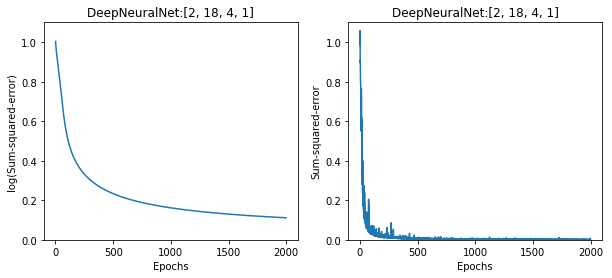

In [6]:
# Set the input data and labels for XOR
X = np.array([ [0, 0, 1, 1], [0, 1, 0, 1] ])
y = np.array([0, 1, 1, 0])
print(X, "\n", y)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

g = [tanh, tanh_d, sigmoid, sigmoid_d, sigmoid, sigmoid_d]
dnn1 = DeepNeuralNet([2, 18, 4, 1], activate = g, eta = 0.5, epochs = 2000).fit(X,y)
ax[0].plot(range(1, len(dnn1.cost_) + 1), dnn1.cost_)
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('log(Sum-squared-error)')
ax[0].set_ylim([0.0, 1.1])
ax[0].set_title('DeepNeuralNet:{}'.format(dnn1.net_arch))

g = [tanh, tanh_d, relu, relu_d, tanh, tanh_d]
dnn2 = DeepNeuralNet([2, 18, 4, 1], activate = g, eta=0.5, epochs=2000).fit(X, y)
ax[1].plot(range(1, len(dnn2.cost_) + 1), dnn2.cost_)
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Sum-squared-error')
ax[1].set_ylim([0.0, 1.1])
ax[1].set_title('DeepNeuralNet:{}'.format(dnn2.net_arch))
plt.show()

# Deep Neural Net for MNIST Data Sets

## 1. Stochastic Gradient Descent Algorithm

In [69]:
#%%writefile code/DeepNerualNet.py
#%load code/DeepNeuralNet.py

import sys
class DeepNeuralNet_SGD(object):
    """ implements a deep neural net. Users may specify any number 
        of layers.
        net_arch -- consists of a number of neurons in each layer 
    """
    def __init__(self, net_arch, activate = None, eta = 1.0, epochs = 100, random_seed = 1):
        
        if not isinstance(net_arch, list):
            sys.exit('Use a list to list number of neurons in each layer.')
        if len(net_arch) < 3:
            sys.exit('Specify the number of neurons more than two layers.')
                     
        self.eta = eta
        self.epochs = epochs
        self.net_arch = net_arch
        self.layers = len(net_arch)
        self.W = []
        self.random_seed = random_seed
        
        # initialize the activation function list with sigmoid() as default
        self.g =       [lambda x: sigmoid(x)   for _ in range(self.layers)]
        self.g_prime = [lambda x: sigmoid_d(x) for _ in range(self.layers)]
        
        # get the user-defined activation functions and their derivatives
        if activate is not None:
            if len(activate) % 2 != 0:
                sys.exit("List activation functions & its derivatives in pairwise")
            if len(activate) > (self.layers - 1) * 2:
                sys.exit("Too many activation functions & its derivatives encountered")
            for i, (g, g_prime) in enumerate(zip(activate[::2], activate[1::2])):
                self.g[i+1] = g
                self.g_prime[i+1] = g_prime
            
    def forpass(self, A0):
        '''
        Z1 = np.dot(self.W1, A0)    # hidden layer inputs
        A1 = self.g(Z1)             # hidden layer outputs/activation func
        Z2 = np.dot(self.W2, A1)
        A2 = self.g(Z2)    
        return Z1, A1, Z2, A2
        '''          
        Z = [[None]]   # Z0 is not used.
        A = []       # A0 = X0 is used. 
        A.append(A0)
        for i in range(1, len(self.W)):
            z = np.dot(self.W[i], A[i-1])
            Z.append(z)
            a = self.g[i](z)
            A.append(a)
        return Z, A
    
    def backprop(self, Z, A, Y):
        '''
        E2 = Y - A2
        E1 = np.dot(self.W2.T, E2)          # E1: hidden errors
        # back prop, error prop
        dZ2 = E2 * self.g_prime(Z2)        # backprop      
        dZ1 = E1 * self.g_prime(Z1)        # backprop  
        # update weights  
        self.W2 +=  self.eta * np.dot(dZ2, A1.T)    
        self.W1 +=  self.eta * np.dot(dZ1, A0.T)    
        '''      
        # initialize empty lists to save E and dZ
        # A place holder None is used to indicated "unused place".
        E  = [None for x in range(self.layers)]
        dZ = [None for x in range(self.layers)]
        
        # Get error at the output layer or the last layer
        ll = self.layers - 1
        error = Y - A[ll]
        E[ll] = error   
        dZ[ll] = error * self.g_prime[ll](Z[ll]) 
        
        # Begin from the back, from the next to last layer
        for i in range(self.layers-2, 0, -1):
            E[i]  = np.dot(self.W[i+1].T, E[i+1])
            dZ[i] = E[i] * self.g_prime[i](Z[i])
       
        # Adjust the weights, using the backpropagation rules
        for i in range(ll, 0, -1):
            self.W[i] += self.eta * np.dot(dZ[i], A[i-1].T)
        return error
         
    def fit(self, X, y):
        #print('X.shape={}, y.shape{}'.format(X.shape, y.shape))
        # Random initialization with range of weight values (-1,1)
        np.random.seed(self.random_seed)
        
        # A place holder 99 is used to indicated "unused place".
        self.W = [[None]]    ## the first W0 is not used.
        for layer in range(self.layers - 1):
            w = 2 * np.random.rand(self.net_arch[layer+1], 
                                   self.net_arch[layer]) - 1
            self.W.append(w)

        self.cost_ = [] 
        self.m_samples = len(y)
        Y = joy.one_hot_encoding(y, self.net_arch[-1]) 
        
        for epoch in range(self.epochs): 
            print('Training epoch {}/{}'.format(epoch+1, self.epochs))
            for m in range(self.m_samples):
                #random_index = np.random.randint(self.m_samples)
                A0 = np.array(X[m], ndmin=2).T   # A0 : inputs, minimum 2d array
                Y0 = np.array(Y[m], ndmin=2).T   # Y: targets
                
                Z, A = self.forpass(A0)          # forward pass
                cost = self.backprop(Z, A, Y0)   # back propagation
                self.cost_.append(np.sqrt(np.sum(cost * cost)))
            
        return self

    def predict(self, X):
        A0 = np.array(X, ndmin=2).T         # A0: inputs
        Z, A = self.forpass(A0)     # forpass
        return A[-1]                                       
   
    def evaluate(self, Xtest, ytest):       # fully vectorized calculation
        m_samples = len(ytest)
        scores = 0        
        A3 = self.predict(Xtest)
        yhat = np.argmax(A3, axis = 0)
        scores += np.sum(yhat == ytest)
        return scores/m_samples * 100
    

# Three-layer Neural Net

In [70]:
import joy
%matplotlib inline

# read mnist dataset
(X, y), (Xtest, ytest) = joy.load_fashion_mnist()     

# set hyperparameters and instantiate the class object   
nn = DeepNeuralNet_SGD([784, 100, 10],  eta = 0.1, epochs = 10)  

# train the model
nn.fit(X, y)       
accuracy = nn.evaluate(X, y)      
print('MNIST accuracy {}%'.format(accuracy)) 
# eta = 0.1, epochs = 3  returns 97.2% accuracy
# eta = 0.1, epochs = 10 returns 97.8% accuracy

Training epoch 1/10
Training epoch 2/10
Training epoch 3/10
Training epoch 4/10
Training epoch 5/10
Training epoch 6/10
Training epoch 7/10
Training epoch 8/10
Training epoch 9/10
Training epoch 10/10
MNIST accuracy 86.41%


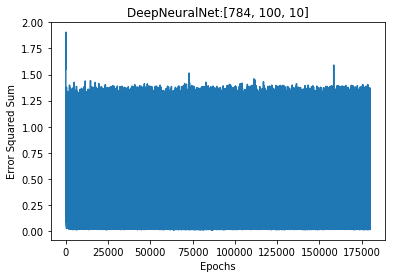

In [20]:
%matplotlib inline
import matplotlib.pyplot as plt 

plt.plot(range(len(nn.cost_)), nn.cost_)
plt.xlabel('Epochs')
plt.ylabel('Error Squared Sum')
plt.title('DeepNeuralNet:{}'.format(nn.net_arch))
plt.show()

# Four-layer Neural Net

In [ ]:
import joy

(X, y), (Xtest, ytest) = joy.load_fashion_mnist()    

nn = DeepNeuralNet_SGD([784, 200, 100, 50, 10], eta = 0.1, epochs=3)                
nn.fit(X, y)                    
accuracy = nn.evaluate(Xtest, ytest)      
print('MNIST accuracy {}%'.format(accuracy))

# DeepNeuralNet_SGD([784, 200, 100, 50, 10], eta = 0.1, epochs=100)
# accuracy 18.8%
# DeepNeuralNet_SGD([784, 200, 100, 50, 10], eta = 0.1, epochs=30)
# accuracy 33.1%
# DeepNeuralNet_SGD([784, 200, 100, 50, 10], eta = 0.1, epochs=50)
# accuracy 20.0%
# DeepNeuralNet_SGD([784, 200, 100, 50, 10], eta = 0.1, epochs=40)
# accuracy 9.5%
# DeepNeuralNet_SGD([784, 300, 200, 50, 10], eta = 0.1, epochs=30)
# accuracy 30.0%
# DeepNeuralNet_SGD([784, 300, 200, 50, 10], eta = 0.1, epochs=30)
# accuracy 20.4%
# DeepNeuralNet_SGD([784, 300, 200, 50, 10], eta = 0.1, epochs=100)    
# accuracy 20.59%

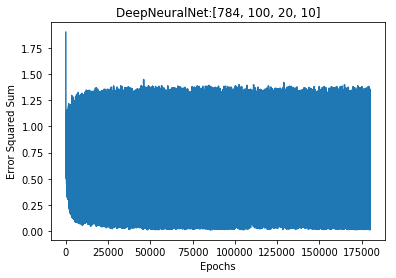

In [22]:
plt.plot(range(len(nn.cost_)), nn.cost_)
plt.xlabel('Epochs')
plt.ylabel('Squared Sum Error')
plt.title('DeepNeuralNet:{}'.format(nn.net_arch))
plt.show()

## 2. Batch Gradient Descent Algorithm

In [67]:
#%%writefile code/DeepNerualNet.py
#%load code/DeepNeuralNet.py

import sys
class DeepNeuralNet_BGD(object):
    """ implements a deep neural net. 
        Users may specify any number of layers.
        net_arch -- consists of a number of neurons in each layer 
    """
    def __init__(self, net_arch, activate = None, eta = 1.0, epochs = 100, random_seed = 1):
        
        if not isinstance(net_arch, list):
            sys.exit('Use a list to list number of neurons in each layer.')
        if len(net_arch) < 3:
            sys.exit('Specify the number of neurons more than two layers.')
                     
        self.eta = eta
        self.epochs = epochs
        self.net_arch = net_arch
        self.layers = len(net_arch)
        self.W = []
        self.random_seed = random_seed
        # A place holder None is used to indicated "unused place".
        self.W = [[None]]    ## the first W0 is not used.
        for layer in range(self.layers - 1):
            w = 2 * np.random.rand(self.net_arch[layer+1], 
                                   self.net_arch[layer]) - 1
            self.W.append(w)
        
        # initialize the activation function list with sigmoid() as default
        self.g =       [lambda x: sigmoid(x) for _ in range(self.layers)]
        self.g_prime = [lambda x: sigmoid_prime(x) for _ in range(self.layers)]
        
        # get the user-defined activation functions and their derivatives
        if activate is not None:
            if len(activate) % 2 != 0:
                sys.exit("List activation functions & its derivatives in pairwise")
            if len(activate) > (self.layers - 1) * 2:
                sys.exit("Too many activation functions & its derivatives encountered")
            for i, (g, g_prime) in enumerate(zip(activate[::2], activate[1::2])):
                self.g[i+1] = g
                self.g_prime[i+1] = g_prime
            
    def forpass(self, A0):    
        Z = [[None]]   # Z0 is not used.
        A = []         # A0 = X0 is used. 
        A.append(A0)
        for i in range(1, len(self.W)):
            z = np.dot(self.W[i], A[i-1])
            Z.append(z)
            a = self.g[i](z)
            A.append(a)
        return Z, A
    
    def backprop(self, Z, A, Y):
        # initialize empty lists to save E and dZ with None
        E  = [None for x in range(self.layers)]
        dZ = [None for x in range(self.layers)]
        # Get error at the output layer or the last layer
        ll = self.layers - 1
        error = Y - A[ll]
        E[ll] = error   
        dZ[ll] = error * self.g_prime[ll](Z[ll]) 
        # Begin from the back, from the next to last layer
        for i in range(self.layers-2, 0, -1):
            E[i]  = np.dot(self.W[i+1].T, E[i+1])
            dZ[i] = E[i] * self.g_prime[i](Z[i])
        # Adjust the weights, using the backpropagation rules    
        for i in range(ll, 0, -1):
            self.W[i] += self.eta * \
            np.dot(dZ[i], A[i-1].T) / self.m_samples
        return error
         
    def fit(self, X, y):
        self.cost_ = [] 
        self.m_samples = len(y)
        Y = joy.one_hot_encoding(y, self.net_arch[-1]) 
        
        for epoch in range(self.epochs): 
            A0 = np.array(X, ndmin=2).T
            Y0 = np.array(Y, ndmin=2).T  

            Z, A = self.forpass(A0)        
            cost = self.backprop(Z, A, Y0)   
            self.cost_.append(np.sqrt(np.sum(cost * cost)))    
        return self

    def predict(self, X):
        A0 = np.array(X, ndmin=2).T         # A0: inputs
        Z, A = self.forpass(A0)     # forpass
        return A[-1]                                       
   
    def evaluate(self, Xtest, ytest):       # fully vectorized calculation
        m_samples = len(ytest)
        scores = 0        
        A3 = self.predict(Xtest)
        yhat = np.argmax(A3, axis = 0)
        scores += np.sum(yhat == ytest)
        return scores/m_samples * 100
    

ValueError: shapes (30,1) and (2,200) not aligned: 1 (dim 1) != 2 (dim 0)

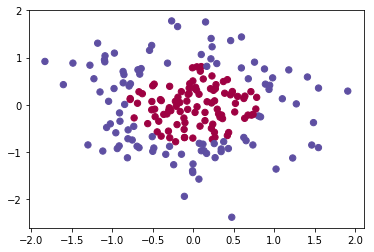

In [68]:
import joy
X, y = joy.gaussian_quantiles()
nn = DeepNeuralNet_BGD([1, 30, 20, 10, 2], eta=0.2, epochs=100)
nn.fit(X.T, y.flatten())
accuracy = nn.evaluate(X, y.flatten())
print('Accuracy: {}%'.format(accuracy))

### 신속한 테스트 (훈련 자료 자체를 테스트함)

[1 5 9 6 4]
m_samples = 30
Training epoch 1/100
MNIST BGD classification accuracy 93.33333333333333%


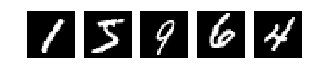

In [24]:
(X, y), (Xtest, ytest) = joy.load_mnist()     

X = X[:30]
y = y[:30]
selected = np.random.choice(X.shape[0], 200)
Xtest = X[selected]
ytest = y[selected]
joy.show_mnist_grid(Xtest[:5].reshape(-1, 28, 28))
print(ytest[:5])

# set hyperparameters and instantiate the class object   
nn = DeepNeuralNet_MNIST_BGD([784, 100, 10],  eta = 0.1, epochs = 100)  

# train the model
nn.fit(X, y)       
accuracy = nn.evaluate(X, y)      
print('MNIST BGD accuracy {}%'.format(accuracy))

### Three-layer Neural Net Testing - Batch GD

In [57]:
(X, y), (Xtest, ytest) = joy.load_fashion_mnist()       
nn = DeepNeuralNet_MNIST_BGD([784, 100, 10], 
                             eta = 0.1, epochs = 1000)  
nn.fit(X[:6000], y[:6000])       
accuracy = nn.evaluate(Xtest[:1000], ytest[:1000])      
print('MNIST classification accuracy {}%'.format(accuracy))

m_samples = 6000
Training epoch 1/1000
Training epoch 101/1000
Training epoch 201/1000
Training epoch 301/1000
Training epoch 401/1000
Training epoch 501/1000
Training epoch 601/1000
Training epoch 701/1000
Training epoch 801/1000
Training epoch 901/1000
MNIST classification accuracy 75.6%


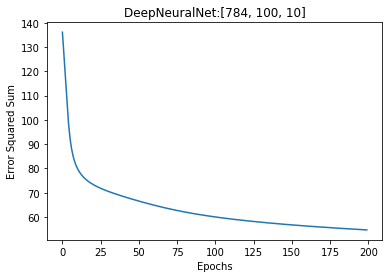

In [58]:
plt.plot(range(len(nn.cost_[:200])), nn.cost_[:200])
plt.xlabel('Epochs')
plt.ylabel('Error Squared Sum')
plt.title('DeepNeuralNet:{}'.format(nn.net_arch))
plt.savefig('[784, 100, 10]', dpi=150)
plt.show()

### Four-layer Neural Net Testing

In [59]:
(X, y), (Xtest, ytest) = joy.load_fashion_mnist()     
nn = DeepNeuralNet_MNIST_BGD([784, 200, 100, 50, 10],
                             eta = 0.1, epochs = 1000)  
nn.fit(X[:6000], y[:6000])       
accuracy = nn.evaluate(Xtest[:1000], ytest[:1000])      
print('MNIST classification accuracy {}%'.format(accuracy))

m_samples = 6000
Training epoch 1/1000
Training epoch 101/1000
Training epoch 201/1000
Training epoch 301/1000
Training epoch 401/1000
Training epoch 501/1000
Training epoch 601/1000
Training epoch 701/1000
Training epoch 801/1000
Training epoch 901/1000
MNIST classification accuracy 83.2%


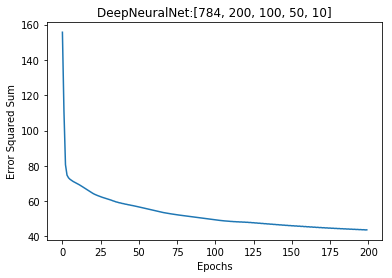

In [55]:
plt.plot(range(len(nn.cost_)), nn.cost_)
plt.xlabel('Epochs')
plt.ylabel('Error Squared Sum')
plt.title('DeepNeuralNet:{}'.format(nn.net_arch))
plt.savefig('[784, 200, 100, 50, 10]', dpi=150)
plt.show()

## 참고자료

http://neuralnetworksanddeeplearning.com/

In [ ]:
#%%writefile code/mnistDeepNet.py
#%load code/mnistDeepNet.py
# deep neural net
# version 0.1
# author: idebtor@gmail.com 

class MnistDeepNet(object):
    """ Mini-batch Stochastic Gradient Descent
    """
    def __init__(self, net_arch, eta = 1.0, epochs = 100, random_seed=1):
        """ 
        """
        self.eta = eta
        self.epochs = epochs
        self.net_arch = net_arch
        self.layers = len(net_arch)
        self.W = []
        self.random_seed = random_seed
        
    def forpass(self, A0):
        '''
        Z1 = np.dot(self.W1, A0)          # hidden layer inputs
        A1 = self.g(Z1)                      # hidden layer outputs/activation func
        Z2 = np.dot(self.W2, A1)
        A2 = self.g(Z2)    
        return Z1, A1, Z2, A2
        '''          
        Z = [[None]]   ## skipping layer 0
        A = []
        A.append(A0)
        for i in range(1, len(self.W)):
            #print('forpass{}, W.shape={} A.shape={}'.
            #      format(i, self.W[i].shape, A[i-1].shape))
            z = np.dot(self.W[i], A[i-1])
            Z.append(z)
            a = self.g(z)
            A.append(a)
        return Z, A
    
    def backprop(self, Z, A, Y):
        for i, (z, a) in enumerate(zip(Z, A)):
            print('Z{}={}'.format(i, z))
            print('A{}={}'.format(i, a))
            
        # initialize an empty
        E  = [None for x in range(self.layers)]
        dZ = [None for x in range(self.layers)]
        # error at the output
        ll = self.layers - 1          #last layer
        error = Y - A[ll]
        
        E[ll] = error          ## E = Y - A[-1]
        dZ[ll] = error * self.g_prime(Z[ll]) ##
        print('first E{} = {}'.format(ll, E[ll]))
        print('first dZ{} = {}'.format(ll, dZ[ll]))
        
        # we need to begin from the back, from the next to last layer
        for i in range(self.layers-2, 0, -1):
            print('Computing..... E{}, dZ{}'.format(i, i))
            E[i]  = np.dot(self.W[i+1].T, E[i+1])
            dZ[i] = E[i] * self.g_prime(Z[i])
            print('Results in ..... E{}={}, dZ{}={}'.
                  format(i, E[i], i, dZ[i]))
            
        for i, (e, z) in enumerate(zip(E, dZ)):
            print('E{}={}'.format(i, e))
            print('dZ{}={}'.format(i, z))
        
        # Adjust the weights, using the backpropagation rules
        for i in range(ll, 0, -1):
            self.W[i] += np.dot(dZ[i], A[i-1].T)
            
        return
         
    def fit(self, X, y):
        """ 
        X: input dataset 
        y: class labels
        """
        print('X.shape={}, y.shape{}'.format(X.shape, y.shape))
        np.random.seed(self.random_seed)
        # Random initialization with range of weight values (-1,1)
        
        self.W = [[1]]
        for layer in range(self.layers - 1):
            w = 2 * np.random.rand(self.net_arch[layer+1], 
                                   self.net_arch[layer]) - 1
            self.W.append(w)
            print('W shape={} added'.format(w.shape)) 

        self.cost_ = []
        m_samples = len(y)       
        print('m samples=', m_samples)
        
        for epoch in range(self.epochs):
            print('Training epoch {}/{}.'.format(epoch + 1, self.epochs))
            Z, A = self.forpass(X)          # forward pass
            
            self.backprop(Z, A, y)              # back propagation
        return self

    def predict(self, X):
        A0 = np.array(X, ndmin=2).T         # A0: inputs
        Z, A = self.forpass(A0)     # forpass
        return A[-1]                                       

    def g(self, x):    # activation function
        return 1/(1 + np.exp((-x)))
    
    def g_prime(self, x):  # gradient or sigmoid derivative
        return self.g(x) * (1 - self.g(x))
    
    def evaluate(self, Xtest, ytest):       # fully vectorized calculation
        m_samples = len(ytest)
        scores = 0        
        A3 = self.predict(Xtest)
        yhat = np.argmax(A3, axis = 0)
        scores += np.sum(yhat == ytest)
        return scores/m_samples * 100
    

# MNIST-Fashion DataSet

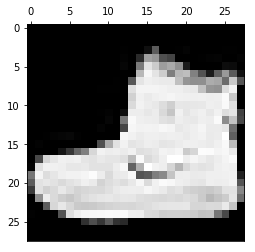

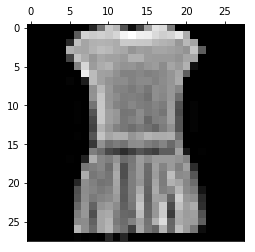

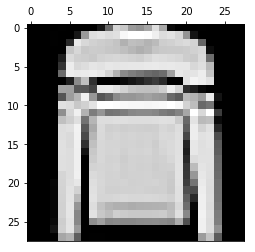

In [71]:
import joy
import matplotlib.pyplot as plt
(X, y), (Xt, yt) = joy.load_fashion_mnist(
                normalize=False, flatten=False)
joy.show_mnist(X[0], savefig='Fashion-MNIST1')
joy.show_mnist(X[3], savefig='Fashion-MNIST2')
joy.show_mnist(X[5], savefig='Fashion-MNIST3')

## Deep Neural Network를 이용한 MNIST-Fashion DataSet 학습

In [75]:
#%%writefile code/DeepNerualNet.py
#%load code/DeepNeuralNet.py

import sys
class DeepNeuralNet_BGD(object):
    """ implements a deep neural net. 
        Users may specify any number of layers.
        net_arch -- consists of a number of neurons in each layer 
    """
    def __init__(self, net_arch, activate = None, eta = 1.0, epochs = 100, random_seed = 1):
        
        if not isinstance(net_arch, list):
            sys.exit('Use a list to list number of neurons in each layer.')
        if len(net_arch) < 3:
            sys.exit('Specify the number of neurons more than two layers.')
                     
        self.eta = eta
        self.epochs = epochs
        self.net_arch = net_arch
        self.layers = len(net_arch)
        self.W = []
        self.random_seed = random_seed
        
        # initialize the activation function list with sigmoid() as default
        self.g =       [lambda x: sigmoid(x)   for _ in range(self.layers)]
        self.g_prime = [lambda x: sigmoid_d(x) for _ in range(self.layers)]
        
        # get the user-defined activation functions and their derivatives
        if activate is not None:
            if len(activate) % 2 != 0:
                sys.exit("List activation functions & its derivatives in pairwise")
            if len(activate) > (self.layers - 1) * 2:
                sys.exit("Too many activation functions & its derivatives encountered")
            for i, (g, g_prime) in enumerate(zip(activate[::2], activate[1::2])):
                self.g[i+1] = g
                self.g_prime[i+1] = g_prime
            
    def forpass(self, A0):
        Z = [[None]]   # Z0 is not used.
        A = []       # A0 = X0 is used. 
        A.append(A0)
        for i in range(1, len(self.W)):
            z = np.dot(self.W[i], A[i-1])
            Z.append(z)
            a = self.g[i](z)
            A.append(a)
        return Z, A
    
    def backprop(self, Z, A, Y):
        # initialize empty lists to save E and dZ
        # A place holder 99 is used to indicated "unused place".
        E  = [None for x in range(self.layers)]
        dZ = [None for x in range(self.layers)]
        
        # Get error at the output layer or the last layer
        ll = self.layers - 1
        error = Y - A[ll]
        E[ll] = error   
        dZ[ll] = error * self.g_prime[ll](Z[ll]) 
        
        # Begin from the back, from the next to last layer
        for i in range(self.layers-2, 0, -1):
            E[i]  = np.dot(self.W[i+1].T, E[i+1])
            dZ[i] = E[i] * self.g_prime[i](Z[i])
       
        # Adjust the weights, using the backpropagation rules
        #self.W2 +=  self.eta * np.dot(dZ2, A1.T)    
        #self.W1 +=  self.eta * np.dot(dZ1, A0.T)  
        m = Y.shape[0] # number of samples
        for i in range(ll, 0, -1):
            if i == 0:
                print('m={}, m_samples={}'.format(m, self.m_samples))
            self.W[i] += self.eta * np.dot(dZ[i], A[i-1].T) / self.m_samples
            
        return error
         
    def fit(self, X, y):
        """ 
        X: input dataset 
        y: class labels
        """
        #print('X.shape={}, y.shape{}'.format(X.shape, y.shape))
        # Random initialization with range of weight values (-1,1)
        np.random.seed(self.random_seed)
        
        # A place holder 99 is used to indicated "unused place".
        self.W = [[None]]    ## the first W0 is not used.
        for layer in range(self.layers - 1):
            w = 2 * np.random.rand(self.net_arch[layer+1], 
                                   self.net_arch[layer]) - 1
            self.W.append(w)

        self.cost_ = [] 
        self.m_samples = len(y)
        print('m_samples =', self.m_samples)
        Y = joy.one_hot_encoding(y, self.net_arch[-1]) 
        
        for epoch in range(self.epochs): 
            if epoch % 100 == 0:
                print('Training epoch {}/{}'.format(epoch+1, self.epochs))

            A0 = np.array(X, ndmin=2).T   # A0 : inputs, minimum 2d array
            Y0 = np.array(Y, ndmin=2).T   # Y: targets

            Z, A = self.forpass(A0)          # forward pass
            cost = self.backprop(Z, A, Y0)   # back propagation
            self.cost_.append(np.sqrt(np.sum(cost * cost)))
            
        return self

    def predict(self, X):
        A0 = np.array(X, ndmin=2).T         # A0: inputs
        Z, A = self.forpass(A0)     # forpass
        return A[-1]                                       
   
    def evaluate(self, Xtest, ytest):       # fully vectorized calculation
        m_samples = len(ytest)
        scores = 0        
        A3 = self.predict(Xtest)
        yhat = np.argmax(A3, axis = 0)
        scores += np.sum(yhat == ytest)
        return scores/m_samples * 100

In [76]:
(X, y), (Xtest, ytest) = joy.load_fashion_mnist()     
nn = DeepNeuralNet_BGD([784, 300, 200, 100, 10], eta = 0.1, epochs = 6000)  
nn.fit(X[:6000], y[:6000])
self = nn.evaluate(X[:1000], y[:1000])
test = nn.evaluate(Xtest[:1000], ytest[:1000])      
print('self accuracy {}%'.format(self))
print('test accuracy {}%'.format(test))

# DeepNeuralNet_MNIST_BGD([784, 200, 100, 50, 10], eta = 0.1, epochs = 1000)
# training classification accuracy 89.1%
# test classification accuracy 83.2%

# DeepNeuralNet_MNIST_BGD([784, 200, 100, 50, 10], eta = 0.1, epochs = 2000) 
# training classification accuracy 93.5%
# test classification accuracy 84.1%

# DeepNeuralNet_MNIST_BGD([784, 200, 100, 50, 10], eta = 0.1, epochs = 4000)  
# training classification accuracy 98.0%
# test classification accuracy 85.7%

# DeepNeuralNet_MNIST_BGD([784, 200, 100, 50, 10], eta = 0.1, epochs = 6000) 
# training classification accuracy 99.1%
# test classification accuracy 85.39999999999999%

# nn = DeepNeuralNet_MNIST_BGD([784, 300, 200, 100, 10], eta = 0.1, epochs = 6000)  
# training classification accuracy 99.9%
# test classification accuracy 85.7%

m_samples = 6000
Training epoch 1/6000
Training epoch 101/6000
Training epoch 201/6000
Training epoch 301/6000
Training epoch 401/6000
Training epoch 501/6000
Training epoch 601/6000
Training epoch 701/6000
Training epoch 801/6000
Training epoch 901/6000
Training epoch 1001/6000
Training epoch 1101/6000
Training epoch 1201/6000
Training epoch 1301/6000
Training epoch 1401/6000
Training epoch 1501/6000
Training epoch 1601/6000
Training epoch 1701/6000
Training epoch 1801/6000
Training epoch 1901/6000
Training epoch 2001/6000
Training epoch 2101/6000
Training epoch 2201/6000
Training epoch 2301/6000
Training epoch 2401/6000
Training epoch 2501/6000
Training epoch 2601/6000
Training epoch 2701/6000
Training epoch 2801/6000


KeyboardInterrupt: 

In [ ]:
plt.plot(range(len(nn.cost_)), nn.cost_)
plt.xlabel('Epochs')
plt.ylabel('Squared Sum Error')
plt.title('DeepNeuralNet:{}'.format(nn.net_arch))
plt.savefig('[784, 200, 100, 50, 10]', dpi=150)
plt.show()

# Guassian_Quantiles() using BGD

In [2]:
import joy
x, y = joy.gaussian_quantiles(random_seed = 1)
joy.plot_xyw(x.T, y.squeeze())

TypeError: gaussian_quantiles() got an unexpected keyword argument 'random_seed'

m_samples = 200
Training epoch 1/5000
Training epoch 101/5000
Training epoch 201/5000
Training epoch 301/5000
Training epoch 401/5000
Training epoch 501/5000
Training epoch 601/5000
Training epoch 701/5000
Training epoch 801/5000
Training epoch 901/5000
Training epoch 1001/5000
Training epoch 1101/5000
Training epoch 1201/5000
Training epoch 1301/5000
Training epoch 1401/5000
Training epoch 1501/5000
Training epoch 1601/5000
Training epoch 1701/5000
Training epoch 1801/5000
Training epoch 1901/5000
Training epoch 2001/5000
Training epoch 2101/5000
Training epoch 2201/5000
Training epoch 2301/5000
Training epoch 2401/5000
Training epoch 2501/5000
Training epoch 2601/5000
Training epoch 2701/5000
Training epoch 2801/5000
Training epoch 2901/5000
Training epoch 3001/5000
Training epoch 3101/5000
Training epoch 3201/5000
Training epoch 3301/5000
Training epoch 3401/5000
Training epoch 3501/5000
Training epoch 3601/5000
Training epoch 3701/5000
Training epoch 3801/5000
Training epoch 3901/5

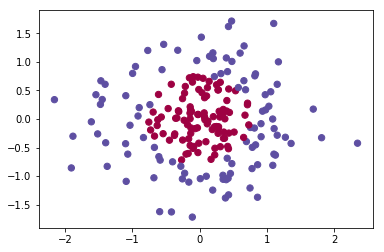

In [30]:
import joy
X, Y = joy.gaussian_quantiles()

nn = DeepNeuralNet_BGD([2, 100, 2], eta=0.2, epochs=3000)
nn.fit(X.T, Y.flatten())
test = nn.evaluate(X.T, Y.flatten())
print('Test accuracy {}%'.format(test))

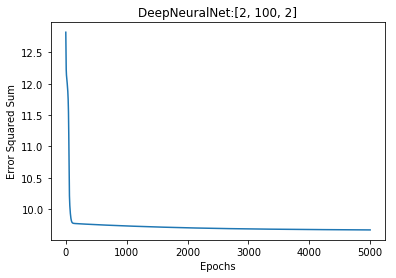

In [32]:
plt.plot(range(len(nn.cost_)), nn.cost_)
plt.xlabel('Epochs')
plt.ylabel('Squared Sum Error')
plt.title('DeepNeuralNet:{}'.format(nn.net_arch))
plt.savefig('[2, 60, 2]', dpi=150)
plt.show()

m_samples = 200
Training epoch 1/5000
Training epoch 101/5000
Training epoch 201/5000
Training epoch 301/5000
Training epoch 401/5000
Training epoch 501/5000
Training epoch 601/5000
Training epoch 701/5000
Training epoch 801/5000
Training epoch 901/5000
Training epoch 1001/5000
Training epoch 1101/5000
Training epoch 1201/5000
Training epoch 1301/5000
Training epoch 1401/5000
Training epoch 1501/5000
Training epoch 1601/5000
Training epoch 1701/5000
Training epoch 1801/5000
Training epoch 1901/5000
Training epoch 2001/5000
Training epoch 2101/5000
Training epoch 2201/5000
Training epoch 2301/5000
Training epoch 2401/5000
Training epoch 2501/5000
Training epoch 2601/5000
Training epoch 2701/5000
Training epoch 2801/5000
Training epoch 2901/5000
Training epoch 3001/5000
Training epoch 3101/5000
Training epoch 3201/5000
Training epoch 3301/5000
Training epoch 3401/5000
Training epoch 3501/5000
Training epoch 3601/5000
Training epoch 3701/5000
Training epoch 3801/5000
Training epoch 3901/5

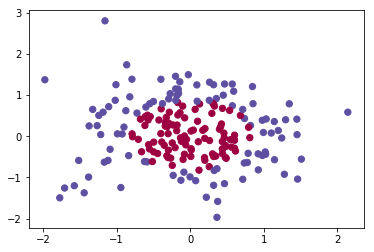

In [28]:
import joy
X, Y = joy.gaussian_quantiles()

nn2 = DeepNeuralNet_BGD([2, 30, 20,10, 2], eta=0.2, epochs=5000)
nn2.fit(X.T, Y.flatten())
test = nn2.evaluate(X.T, Y.flatten())
print('Test accuracy {}%'.format(test))

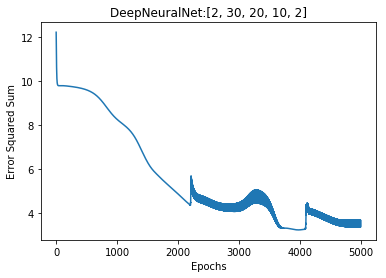

In [31]:
plt.plot(range(len(nn2.cost_)), nn2.cost_)
plt.xlabel('Epochs')
plt.ylabel('Squared Sum Error')
plt.title('DeepNeuralNet:{}'.format(nn2.net_arch))
plt.savefig('[2, 30, 20, 10, 2]', dpi=150)
plt.show()

# Guassian_Quantiles() using SGD

Training epoch 1/5
Training epoch 2/5
Training epoch 3/5
Training epoch 4/5
Training epoch 5/5
Testing classification accuracy 55.00000000000001%


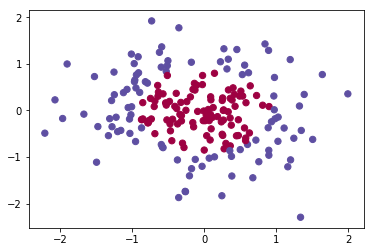

In [39]:
import joy
X, Y = joy.gaussian_quantiles()

nn_SGD = DeepNeuralNet_SGD([2, 100, 2], eta=0.2, epochs=5)
nn_SGD.fit(X.T, Y.flatten())
test = nn.evaluate(X.T, Y.flatten())
print('Test accuracy {}%'.format(test))

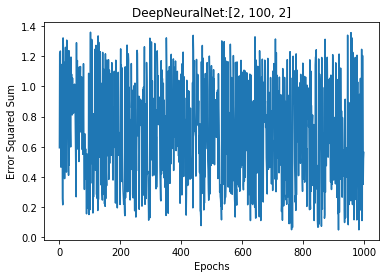

In [43]:
plt.plot(range(len(nn_SGD.cost_)), nn_SGD.cost_)
plt.xlabel('Epochs')
plt.ylabel('Squared Sum Error')
plt.title('DeepNeuralNet:{}'.format(nn_SGD.net_arch))
plt.savefig('[2, 60, 2]', dpi=150)
plt.show()

Training epoch 1/5
Training epoch 2/5
Training epoch 3/5
Training epoch 4/5
Training epoch 5/5
Testing classification accuracy 92.5%


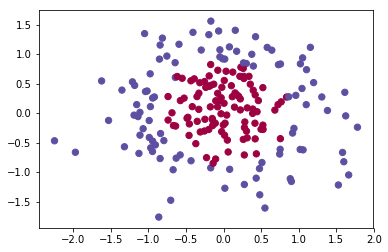

In [41]:
import joy
X, Y = joy.gaussian_quantiles()

nn_SGD2 = DeepNeuralNet_SGD([2, 30, 20,10, 2], eta=0.2, epochs=5)
nn_SGD2.fit(X.T, Y.flatten())
test = nn2.evaluate(X.T, Y.flatten())
print('Test accuracy {}%'.format(test))

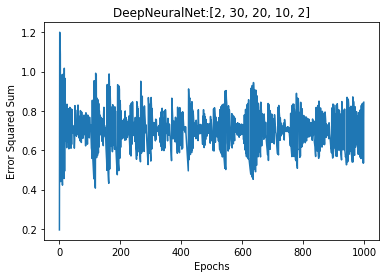

In [44]:
plt.plot(range(len(nn_SGD2.cost_)), nn_SGD2.cost_)
plt.xlabel('Epochs')
plt.ylabel('Squared Sum error')
plt.title('DeepNeuralNet:{}'.format(nn_SGD2.net_arch))
plt.savefig('[2, 30, 20, 10, 2]', dpi=150)
plt.show()

# DEEP_MNIST_DROPOUT

In [69]:
#%%writefile code/DeepNerualNet.py
#%load code/DeepNeuralNet.py

import sys
class DeepNeuralNet_Dropout_MNIST_BGD(object):
    """ implements a deep neural net. Users may specify any number 
        of layers.
        net_arch -- consists of a number of neurons in each layer 
    """
    def __init__(self, net_arch, activate = None, eta = 1.0, epochs = 100, random_seed = 1, dropout_ratio = 0.5):
        
        if not isinstance(net_arch, list):
            sys.exit('Use a list to list number of neurons in each layer.')
        if len(net_arch) < 3:
            sys.exit('Specify the number of neurons more than two layers.')
                     
        self.eta = eta
        self.epochs = epochs
        self.net_arch = net_arch
        self.layers = len(net_arch)
        self.W = []
        self.random_seed = random_seed
        self.dropout_ratio = dropout_ratio
        self.drop_units = None
        
        # initialize the activation function list with sigmoid() as default
        self.g = [lambda x: sigmoid(x) for _ in range(self.layers)]
        self.g_prime = [lambda x: sigmoid_prime(x) for _ in range(self.layers)]
        
        # get the user-defined activation functions and their derivatives
        if activate is not None:
            if len(activate) % 2 != 0:
                sys.exit("List activation functions & its derivatives in pairwise")
            if len(activate) > (self.layers - 1) * 2:
                sys.exit("Too many activation functions & its derivatives encountered")
            for i, (g, g_prime) in enumerate(zip(activate[::2], activate[1::2])):
                self.g[i+1] = g
                self.g_prime[i+1] = g_prime
            
    def forpass(self, A0, train=True):
        '''
        Z1 = np.dot(self.W1, A0)    # hidden layer inputs
        A1 = self.g(Z1)             # hidden layer outputs/activation func
        Z2 = np.dot(self.W2, A1)
        A2 = self.g(Z2)    
        return Z1, A1, Z2, A2
        '''                  
        Z = [[None]]   # Z0 is not used.
        A = []       # A0 = X0 is used. 
       
        A.append(A0)    
        for i in range(1, len(self.W)):
            # Dropout
            if i == 2 and train:
                self.drop_units = np.random.rand(*A[i-1].shape) > self.dropout_ratio
                A[i-1] = A[i-1] * self.drop_units
            else:
                A[i-1] = A[i-1] * (1.0 - self.dropout_ratio)
                
            z = np.dot(self.W[i], A[i-1])
            Z.append(z)
            a = self.g[i](z)
            A.append(a)
        
        return Z, A
    
    def backprop(self, Z, A, Y):
        '''
        E2 = Y - A2
        E1 = np.dot(self.W2.T, E2)          # E1: hidden errors
        # back prop, error prop
        dZ2 = E2 * self.g_prime(Z2)        # backprop      
        dZ1 = E1 * self.g_prime(Z1)        # backprop  
        # update weights  
        self.W2 +=  self.eta * np.dot(dZ2, A1.T)    
        self.W1 +=  self.eta * np.dot(dZ1, A0.T)    
        '''      
        # initialize empty lists to save E and dZ
        # A place holder 99 is used to indicated "unused place".
        E  = [None for x in range(self.layers)]
        dZ = [None for x in range(self.layers)]
        
        # Get error at the output layer or the last layer
        ll = self.layers - 1
        
        error = Y - A[ll]
        E[ll] = error   
        dZ[ll] = error * self.g_prime[ll](Z[ll]) 
    
        # Begin from the back, from the next to last layer
        for i in range(self.layers-2, 0, -1):
            # Dropout
            if i == 1:
                Z[i] = Z[i] * self.drop_units
                
            E[i]  = np.dot(self.W[i+1].T, E[i+1])
            dZ[i] = E[i] * self.g_prime[i](Z[i])
       
        # Adjust the weights, using the backpropagation rules
        #self.W2 +=  self.eta * np.dot(dZ2, A1.T)    
        #self.W1 +=  self.eta * np.dot(dZ1, A0.T)        
        for i in range(ll, 0, -1):
            self.W[i] += self.eta * np.dot(dZ[i], A[i-1].T) / self.m_samples
            
        return error
         
    def fit(self, X, y):
        """ 
        X: input dataset 
        y: class labels
        """
        #print('X.shape={}, y.shape{}'.format(X.shape, y.shape))
        # Random initialization with range of weight values (-1,1)
        np.random.seed(self.random_seed)
        
        # A place holder 99 is used to indicated "unused place".
        self.W = [[None]]    ## the first W0 is not used.
        for layer in range(self.layers - 1):
            w = 2 * np.random.rand(self.net_arch[layer+1], 
                                   self.net_arch[layer]) - 1
            self.W.append(w)

        self.cost_ = [] 
        self.m_samples = len(y)
        print('m_samples =', self.m_samples)
        Y = joy.one_hot_encoding(y, self.net_arch[-1]) 
        
        for epoch in range(self.epochs): 
            if epoch % 100 == 0:
                print('Training epoch {}/{}'.format(epoch+1, self.epochs))

            A0 = np.array(X, ndmin=2).T   # A0 : inputs, minimum 2d array
            Y0 = np.array(Y, ndmin=2).T   # Y: targets

            Z, A = self.forpass(A0)          # forward pass
            cost = self.backprop(Z, A, Y0)   # back propagation
            self.cost_.append(np.sqrt(np.sum(cost * cost)))
            
        return self

    def predict(self, X):
        A0 = np.array(X, ndmin=2).T         # A0: inputs
        Z, A = self.forpass(A0, train=False)     # forpass
        return A[-1]                                       
   
    def evaluate(self, Xtest, ytest):       # fully vectorized calculation
        m_samples = len(ytest)
        scores = 0        
        A3 = self.predict(Xtest)
        yhat = np.argmax(A3, axis = 0)
        scores += np.sum(yhat == ytest)
        return scores/m_samples * 100
    

In [71]:
import joy
import numpy as np

(X, y), (Xtest, ytest) = joy.load_mnist()   
nn = DeepNeuralNet_Dropout_MNIST_BGD([784, 100, 10], eta=0.2, epochs=1000, dropout_ratio=0.5)

nn.fit(X, y)  
self_accuracy = nn.evaluate(X, y)  
test_accuracy = nn.evaluate(Xtest, ytest)      
print('self accuracy {}%'.format(self_accuracy))
print('test accuracy {}%'.format(test_accuracy))

m_samples = 60000
Training epoch 1/1000
Training epoch 101/1000
Training epoch 201/1000
Training epoch 301/1000
Training epoch 401/1000
Training epoch 501/1000
Training epoch 601/1000
Training epoch 701/1000
Training epoch 801/1000
Training epoch 901/1000
self accuracy 82.77666666666667%
test accuracy 83.17999999999999%


# MnistMiniBatchGD

In [3]:
#%%writefile code/MnistMiniBatch.py
#%load code/MnistMiniBatch.py
class MnistMiniBatchGD(object):
    """ Mini-batch Gradient Descent
    """
    def __init__(self, n_x, n_h, n_y, eta = 0.1, epochs = 100, batch_size = 32, random_seed=1):
        """ 
        """
        self.n_x = n_x
        self.n_h = n_h
        self.n_y = n_y
        self.eta = eta
        self.epochs = epochs
        self.batch_size = batch_size
        np.random.seed(random_seed)
        self.W1 = 2*np.random.random((self.n_h, self.n_x)) - 1  # between -1 and 1
        self.W2 = 2*np.random.random((self.n_y, self.n_h)) - 1  # between -1 and 1
        #print('W1.shape={}, W2.shape={}'.format(self.W1.shape, self.W2.shape))
        
    def forpass(self, A0, train=True):
        Z1 = np.dot(self.W1, A0)          # hidden layer inputs
        A1 = self.g(Z1)                      # hidden layer outputs/activation func
        '''
        # Dropout
        if train:
            self.drop_units = np.random.rand(*A1.shape) > self.dropout_ratio
            A1 = A1 * self.drop_units
        else:
            A1 = A1 * (1.0 - self.dropout_ratio)
        '''
           
        Z2 = np.dot(self.W2, A1)          # output layer inputs
        A2 = self.g(Z2)                       # output layer outputs/activation func
        return Z1, A1, Z2, A2

    def fit(self, X, y):
        """ 
        X: input dataset 
        y: class labels
        """

        self.cost_ = []
        m_samples = len(y)       
        Y = joy.one_hot_encoding(y, self.n_y)       # (m, n_y) = (m, 10)   one-hot encoding
        #print('X.shape={}, y.shape={}, Y.shape={}'.format(X.shape, y.shape, Y.shape))
        
        for epoch in range(self.epochs):
            #print('Training epoch {}/{}.'.format(epoch + 1, self.epochs))
            for i in range(0, m_samples, self.batch_size):
                A0 = X[i: i + self.batch_size]
                Y0 = Y[i: i + self.batch_size]
                
                A0 = np.array(A0, ndmin=2).T
                Y0 = np.array(Y0, ndmin=2).T

                Z1, A1, Z2, A2 = self.forpass(A0)        

                E2 = Y0 - A2                 
                E1 = np.dot(self.W2.T, E2)       

                # back prop, error prop
                dZ2 = E2 * self.g_prime(Z2)     
                dZ1 = E1 * self.g_prime(Z1)    
                '''
                # Dropout
                dZ1 = dZ1 * self.drop_units       
                '''
                
                # update weights
                self.W2 +=  self.eta * np.dot(dZ2, A1.T)     
                self.W1 +=  self.eta * np.dot(dZ1, A0.T)    

                self.cost_.append(np.sqrt(np.sum(E2 * E2)
                                          /self.batch_size))
        return self

    def predict(self, X):
        A0 = np.array(X, ndmin=2).T         # A0: inputs
        Z1, A1, Z2, A2 = self.forpass(A0, train=False)   # forpass
        return A2                                       

    def g(self, x):                             # activation_function: sigmoid
        return 1.0/(1.0+np.exp(-x))
    
    def g_prime(self, x):                    # activation_function: sigmoid derivative
        return self.g(x) * (1 - self.g(x))
    
    def evaluate(self, Xtest, ytest):       
        m_samples = len(ytest)
        scores = 0        
        A2 = self.predict(Xtest)
        yhat = np.argmax(A2, axis = 0)
        scores += np.sum(yhat == ytest)
        return scores/m_samples * 100

In [4]:
import joy
(X, y), (Xtest, ytest) = joy.load_mnist()
nn = MnistMiniBatchGD(784, 600, 10, epochs = 40)
nn.fit(X[:3000], y[:3000])
self = nn.evaluate(X[:3000], y[:3000])
test = nn.evaluate(Xtest[:1000], ytest[:1000])
print('MNIST self accuracy {}%'.format(self))
print('MNIST test accuracy {}%'.format(test))

MNIST self accuracy 100.0%
MNIST test accuracy 89.3%


# MNIST-Mini-BatchGD_Dropout

In [5]:
#%%writefile code/MnistMiniBatch.py
#%load code/MnistMiniBatch.py
class MnistMiniBatchGD_Dropout(object):
    """ Mini-batch Gradient Descent with Dropout
    """
    def __init__(self, n_x, n_h, n_y, eta = 0.1, epochs = 100, batch_size = 32, random_seed=1, dropout_ratio=0.5):
        """ 
        """
        self.n_x = n_x
        self.n_h = n_h
        self.n_y = n_y
        self.eta = eta
        self.epochs = epochs
        self.batch_size = batch_size
        np.random.seed(random_seed)
        self.dropout_ratio = dropout_ratio
        self.W1 = 2*np.random.random((self.n_h, self.n_x)) - 1  # between -1 and 1
        self.W2 = 2*np.random.random((self.n_y, self.n_h)) - 1  # between -1 and 1
        #print('W1.shape={}, W2.shape={}'.format(self.W1.shape, self.W2.shape))
        
    def forpass(self, A0, train=True):
        Z1 = np.dot(self.W1, A0)                # hidden layer inputs
        A1 = self.g(Z1)                         # hidden layer outputs/activation func

        # Dropout
        if train:
            self.drop_units = np.random.rand(*A1.shape) > self.dropout_ratio
            A1 = A1 * self.drop_units / self.dropout_ratio
          
        Z2 = np.dot(self.W2, A1)                # output layer inputs
        A2 = self.g(Z2)                         # output layer outputs/activation func
        return Z1, A1, Z2, A2

    def fit(self, X, y):
        """ 
        X: input dataset 
        y: class labels
        """

        self.cost_ = []
        m_samples = len(y)       
        Y = joy.one_hot_encoding(y, self.n_y)       # (m, n_y) = (m, 10)   one-hot encoding
        #print('X.shape={}, y.shape={}, Y.shape={}'.format(X.shape, y.shape, Y.shape))
        
        for epoch in range(self.epochs):
            #print('Training epoch {}/{}.'.format(epoch + 1, self.epochs))
            for i in range(0, m_samples, self.batch_size):
                A0 = X[i: i + self.batch_size].T
                Y0 = Y[i: i + self.batch_size].T
                Z1, A1, Z2, A2 = self.forpass(A0)        

                E2 = Y0 - A2                 
                E1 = np.dot(self.W2.T, E2)       

                # back prop, error prop
                dZ2 = E2 * self.g_prime(Z2)     
                dZ1 = E1 * self.g_prime(Z1)    

                # Dropout
                dZ1 = dZ1 * self.drop_units       

                # update weights
                self.W2 +=  self.eta * np.dot(dZ2, A1.T)     
                self.W1 +=  self.eta * np.dot(dZ1, A0.T)    

                self.cost_.append(np.sqrt(np.sum(E2 * E2)
                                          /self.batch_size))
        return self

    def predict(self, X):
        A0 = np.array(X, ndmin=2).T         # A0: inputs
        Z1, A1, Z2, A2 = self.forpass(A0, train=False)   # forpass
        return A2                                       

    def g(self, x):                             # activation_function: sigmoid
        return 1.0/(1.0+np.exp(-x))
    
    def g_prime(self, x):                    # activation_function: sigmoid derivative
        return self.g(x) * (1 - self.g(x))
    
    def evaluate(self, Xtest, ytest):       
        m_samples = len(ytest)
        scores = 0        
        A2 = self.predict(Xtest)
        yhat = np.argmax(A2, axis = 0)
        scores += np.sum(yhat == ytest)
        return scores/m_samples * 100

In [6]:
import joy
(X, y), (Xtest, ytest) = joy.load_mnist()
nn = MnistMiniBatchGD_Dropout(784, 600, 10, 
            epochs = 40, dropout_ratio = 0.5)
nn.fit(X[:3000], y[:3000])
self = nn.evaluate(X[:3000], y[:3000])
test = nn.evaluate(Xtest[:1000], ytest[:1000])
print('MNIST self accuracy {}%'.format(self))
print('MNIST test accuracy {}%'.format(test))

MNIST self accuracy 99.73333333333333%
MNIST test accuracy 91.7%


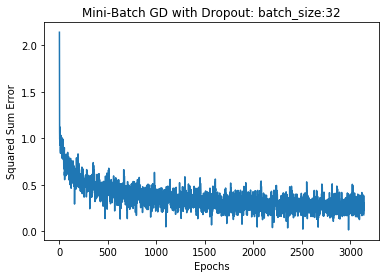

In [6]:
import matplotlib.pyplot as plt

plt.plot(range(len(nn.cost_)), nn.cost_)
plt.xlabel('Epochs')
plt.ylabel('Squared Sum Error')
plt.title('Mini-Batch GD with Dropout: batch_size:{}'
          .format(nn.batch_size))
plt.show()

In [53]:
nn2 = MnistMiniBatchGD(784, 600, 10, epochs = 20)
nn2.fit(X[:5000], y[:5000])
self = nn2.evaluate(X[:5000], y[:5000])
test = nn2.evaluate(Xtest[:1000], ytest[:1000])
print('MNIST self accuracy {}%'.format(self))
print('MNIST test accuracy {}%'.format(test))

MNIST self accuracy 99.92%
MNIST test accuracy 91.9%


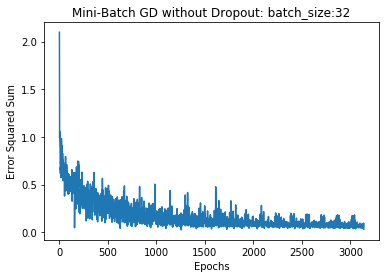

In [52]:
plt.plot(range(len(nn2.cost_)), nn2.cost_)
plt.xlabel('Epochs')
plt.ylabel('Error Squared Sum')
plt.title('Mini-Batch GD without Dropout: batch_size:{}'
          .format(nn2.batch_size))
plt.show()

## 학습 정리
- 기계학습을 위한 오픈 프레임워크는 무엇이 있는지 알아보기.
- TensorFlow, Keras, PyTorch가 무엇인지 이해하기.
- CNN을 이용한 MNIST 데이터를 3가지 프레임워크로 학습하는 것을 이해하기.


----------
Rejoice in the Lord always. I will say it again: Rejoice! (Ph4:4)